# Dimensionality Reduction
- Less complex dataset
- Less disk space
- Less computation time
- lower chance of model overfitting
## Method : 
- Feature selection
- Feature extraction



In [1]:
# import library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Data Preparations

In [2]:
PATH = 'data/pokemon.csv'

pokemon = pd.read_csv(PATH, index_col=0)

pokemon.head()

,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
#,,,,,,,,,,,,
1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


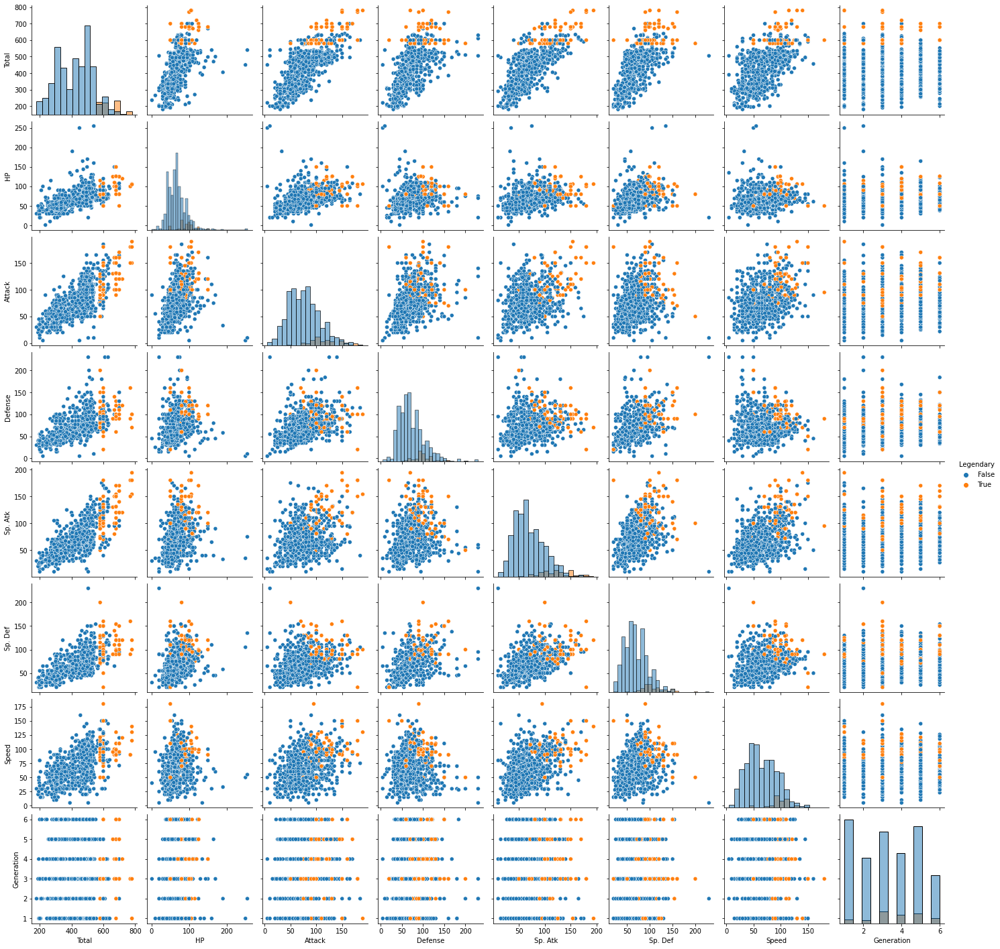

In [3]:
# sns pairplot to see redundant feature
sns.pairplot(pokemon, hue='Legendary', diag_kind='hist')

## t-SNE

In [4]:
pokemon_numeric = pokemon[['HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']]

In [5]:
from sklearn.manifold import TSNE

model = TSNE(learning_rate=50)

tsne_features = model.fit_transform(pokemon_numeric)

pokemon['x'] = tsne_features[:,0]
pokemon['y'] = tsne_features[:,1]

<AxesSubplot:xlabel='x', ylabel='y'>

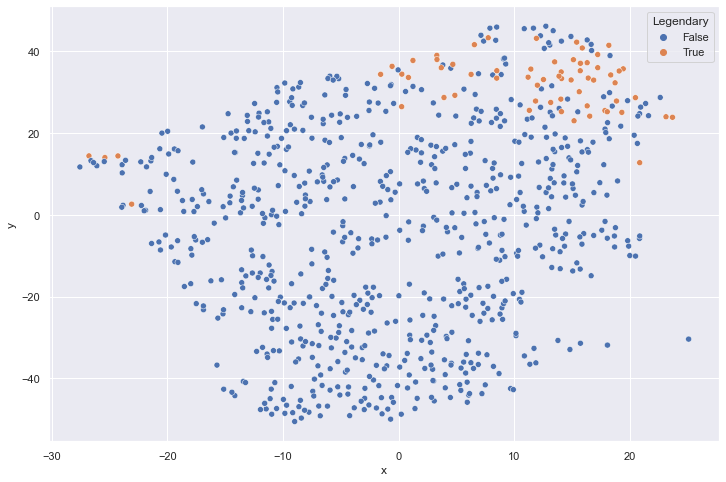

In [6]:
plt.figure(figsize=(12, 8))
sns.set()
sns.scatterplot(x='x', y='y', data=pokemon, hue='Legendary')

## Basic Classification model with Logistic Regression

In [7]:
from sklearn.model_selection import train_test_split

X = pokemon_numeric
y = pokemon['Legendary']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,  random_state = 123)

In [8]:
# basic classification model
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()

lr.fit(X_train, y_train)

print(f'Accuracy Score : {lr.score(X_test, y_test)}')

Accuracy Score : 0.9375


## Using Scaler for preprocessing data

In [9]:
# with scaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_std =scaler.fit_transform(X_train)
X_test_std = scaler.fit_transform(X_test)

lr.fit(X_train_std, y_train)

print(f'Accuracy Score : {lr.score(X_test_std, y_test)}')

Accuracy Score : 0.95


## Selecting features with RFE (Recursive Feature Elimination)

In [10]:
from sklearn.feature_selection import RFE


rfe = RFE(estimator=LogisticRegression(), n_features_to_select=3, verbose=1)
rfe.fit(X_train_std, y_train)

Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.


RFE(estimator=LogisticRegression(), n_features_to_select=3, verbose=1)

In [11]:
print(X.columns[rfe.support_])

print(f'Accuracy Score after feature elimination : {rfe.score(X_test_std, y_test)}')

Index(['Defense', 'Sp. Atk', 'Speed'], dtype='object')
Accuracy Score after feature elimination : 0.9291666666666667


# Feature Extraction with PCA

In [12]:
pokemon_cat = pokemon[['Type 1', 'Legendary']]

pokemon_cat.head()

,Type 1,Legendary
#,,
1,Grass,False
2,Grass,False
3,Grass,False
3,Grass,False
4,Fire,False


In [15]:
pokemon_numeric = pokemon[['HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']]
pokemon_numeric

,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
#,,,,,,
1,45,49,49,65,65,45
2,60,62,63,80,80,60
3,80,82,83,100,100,80
3,80,100,123,122,120,80
4,39,52,43,60,50,65
...,...,...,...,...,...,...
719,50,100,150,100,150,50
719,50,160,110,160,110,110
720,80,110,60,150,130,70


In [16]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=2))
])

pokemon_pca = pipeline.fit_transform(pokemon_numeric)

<AxesSubplot:xlabel='PC 1', ylabel='PC 2'>

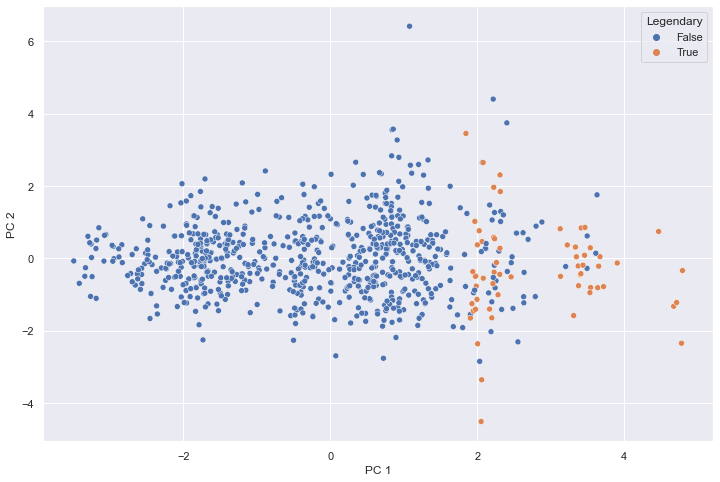

In [17]:
pokemon_cat['PC 1'] = pokemon_pca[:, 0]
pokemon_cat['PC 2'] = pokemon_pca[:, 1]

plt.figure(figsize=(12, 8))
sns.scatterplot(data=pokemon_cat, x='PC 1', y='PC 2', hue='Legendary')

## Classification with PCA

In [18]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=2)),
    ('clf', LogisticRegression())
])

0.9458333333333333